# Practica 1 - Tracking de vehículos

- Lluís Llull Riera
- Pablo Martín Escobar

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import plotly.graph_objects as go
import math
from sklearn.cluster import DBSCAN

### Funciones auxiliaries

Antes de entrar directamente en la explicación de como funciona el algoritmo que hemos desarrollado vamos a declarar algunas funcionas auxliares, estas nos serviran para calcular velocidades, aceleración, realizar prints, etc.

In [2]:
def euclidean_distance(point1, point2):
    """
    Calculate the Euclidean distance between two 3D points.
    Args:
        point1 (tuple): A tuple of three floats representing the first point (x1, y1, z1).
        point2 (tuple): A tuple of three floats representing the second point (x2, y2, z2).
    Returns:
        float: The Euclidean distance between the two points.
    """
    x1, y1, z1 = point1
    x2, y2, z2 = point2
    
    distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)
    return distance


def calcular_velocidad(punto1, punto2, tiempo):
    """
    Calcula la velocidad entre dos puntos dados y el tiempo transcurrido.
    Args:
        punto1 (tuple): Coordenadas (x, y, z) del primer punto.
        punto2 (tuple): Coordenadas (x, y, z) del segundo punto.
        tiempo (float): Tiempo transcurrido entre los dos puntos.
    Returns:
        float: Velocidad calculada redondeada a dos decimales, o None si el tiempo es menor o igual a cero.
    """
    # Extraer coordenadas
    x1, y1, z1 = punto1
    x2, y2, z2 = punto2
    
    # Calcular la distancia euclidiana entre los dos puntos
    distancia = euclidean_distance(punto1, punto2)
    
    # Calcular la velocidad dividiendo la distancia por el tiempo
    if tiempo > 0:
        velocidad = distancia / tiempo
        return round(velocidad,2)
    else:
        return None
    
def calcular_aceleracion(velocidad1, velocidad2, tiempo):
    """
    Calcula la aceleración dada la velocidad inicial, la velocidad final y el tiempo transcurrido.

    Args:
        velocidad1 (float): La velocidad inicial.
        velocidad2 (float): La velocidad final.
        tiempo (float): El tiempo transcurrido.

    Returns:
        float: La aceleración calculada, redondeada a dos decimales.
        None: Si el tiempo es menor o igual a cero.
    """
    # Calcular la aceleración dividiendo la diferencia de velocidades por el tiempo
    if tiempo > 0:
        aceleracion = (velocidad2 - velocidad1) / tiempo
        return round(aceleracion,2)
    else:
        return None

In [3]:
colors = [
    "red", "green", "blue", "yellow", "purple", "orange", "pink", "brown", 
    "black", "magenta", "gray", "cyan", "lime", "olive", "teal", "navy"]
numbers_colors_dict = {i: colors[i % len(colors)] for i in range(20)}

In [4]:
def print2D(df,ax,frame_id):
    df['color'] = df['id'].apply(lambda x: numbers_colors_dict[x])
    # df['hover_text'] = df['id'].apply(lambda row: f"ID: {row}")

    # Create the plot
    # plt.figure()
    ax.scatter(df['x'], df['z'], c=df['color'], marker='o')

    ax.set_xlim(0, -70)
    ax.axis('equal')
    
    ax.set_title(f'Frame {frame_id}')

    ax.axhline(-1.5, color='gray', lw=1, ls='-')
    ax.axvline(-20, color='gray', lw=1, ls='--')
    ax.axvline(-40, color='gray', lw=1, ls='--')

    # plt.show()

In [5]:
def print3D(df, vehicles = None):
    df['color'] = df['id'].apply(lambda x: numbers_colors_dict[x])
    df['hover_text'] = df['id'].apply(lambda row: f"ID: {row}")

    fig = go.Figure(data=[go.Scatter3d(
        x=df['x'],
        y=df['y'],
        z=df['z'],
        mode='markers',
        text= df['hover_text'], # hover text
        marker=dict(
            size=2,
            color= df['color'],
            
        )
    )])

    if vehicles is not None:
        for i,vehicle in vehicles.iterrows():
            fig.add_trace(go.Scatter3d(
                x=[vehicle['x']], y=[vehicle['y']+2], z=[vehicle['z']+1.5],
                mode='text',
                text=['VEC ' + str(vehicle['id'])+'. VEL: '+str(vehicle['velocidad'])+ '. ACC: '+str(vehicle['aceleracion'])],
                textposition='top center',
                textfont=dict(
                    size=12,
                    color='black'
                )
            ))

    fig.update_layout(scene=dict(
                        xaxis_title='X AXIS TITLE',
                        yaxis_title='Y AXIS TITLE',
                        zaxis_title='Z AXIS TITLE',
                        aspectmode='data'),
                        width=700,
                        margin=dict(r=20, b=10, l=10, t=10)
                        )

    fig.show()


In [6]:
def printStudiOfVehicles(df):
    print('ESTUDIO DE LOS VEHICULOS')
    print('Cantidad de vehiculos: ', df['id'].nunique())
    print(f'Clusters detectados que posiblemente no sean vehiculos {df.id.value_counts()[df.id.value_counts()<2].sum()}')
    print(f'Total frames: {df.frame_id.nunique()}')
    print('')

    grouped = df.groupby('id').agg({'id':'count', 'velocidad':'mean', 'aceleracion':'mean'})    
    grouped.columns = ['vec_veces_aparecido', 'velocidad_promedio', 'aceleracion_promedio']
    print(grouped)

### Explicación del funcionamiento del algoritmo

Lo que pretende la siguiente función es realizar un tracking de cada uno de los vehículos que aparecen en los dataframes obtenidos y conseguir detectar cuando en dos frames diferentes consecutivos aparece el mismo vehículo. Esto se logrará utilizando un algoritmo de clustering, en específico el DBSCAN y posteriormente comparando las distancias entre los centroides de dos frames diferentes consecutivos y relaciones esos que tengan una distancia mínima y lógica.

**Datos utilizados**

Se utilizarán los dataframes proporcionados para realizar la práctica. Se trata de un total de 300 dataframes consecutivos.

**Parámetros utilizados**
- *printerIterator* -> Cada cuantos frames se quiere realizar un plot
- *endFrame* -> Frame donde finaliza la ejecución del algoritmo
- *printMethod* -> Se dispone de dos sistemas de representación. Uno en dos dimensiones ('2d') y otro en tres dimensiones ('3d')

**Selección del algoritmo de clustering**

Se ha elegido el algoritmo de *DBSCAN* en frente del *KMEANS* (que son los dos algoritmos de clustering que se han visto en clase), ya que el KMEANS nos obliga a determinar la cantidad de clusters a encontrar, en cambio, *DBSCAN* nos permite ejecutarlo sin la necesidad de indicar cuantos clusters queremos encontrar, esto tiene sentido ya a priori no sabemos cuantos vehículos pueden aparecen en un frame.

Para aumentar la precisión del algoritmo de clustering se han realizado varias pruebas con diferentes parámetros. Al final nos hemos quedado con *eps=2.5* y *min_samples=25*, con el objetivo de obtener clusters densos . Además, antes proseguir con la detección de clusters e identificación de vehículos, se eliminan todos los puntos que no pertenecen a ningún cluster y también todos esos clusters con una cantidad menor a un número arbitrario *min_number_points*, (con A/B testing se ha seleccionado 30), con el objetivo de eliminar el ruido y no coger los puntos que no perteecena  ningún vehículo.

**Output del algoritmo**

El output del algoritmo es un dataframe el cual contiene la información de todos los vehículos que aparecen en cada frame. Este consta del ID del vehículo (*id*), puntos donde se encuentra el centroide del cluster que determina el vehículo (*x, y, z*), el identificador del frame (*frame_id*), la velocidad y la aceleración del vehículo en ese instante.

**Otras Consideraciones**

Durante el proceso, se calcula la velocidad y la aceleración para cada uno de los frames, estos datos se enseñan en el plot cuando se realiza el print *3d*. Además, también podemos estudiar a posteriori a partir del dataframe obtenido como output la evolución de la velocidad y aceleración para cada vehículo.

Se considera una distancia arbitraria *max_distance_vehicles* la cual es la que nos permite diferenciar cuando un cluster es el mismo vehículo que el frame anterior o si, por otra parte, lo consideramos un vehículo nuevo. Realizando diferentes pruebas se ha seleccionado el valor 12.

Se sabe que entre dos frames diferentes el tiempo transcurrido es de 0.1 segundo.

In [7]:
def representTrackingFrames(printerIterator,endFrame = 0, printMethod = '3d'):
    df_vecs = pd.DataFrame(columns= ['id','x','y','z','frame_id','velocidad','aceleracion'])

    folder_path = './data/pointclouds_traking/pointclouds/'
    time_per_frame = 0.1
    # List all files in the folder
    files = os.listdir(folder_path)
    file_id = 0
    max_distannce_vehicles = 13
    min_number_points = 30
    
    if printMethod == '2d':
        num_plots = len(files) if endFrame == 0 else endFrame
        num_plots = num_plots // printerIterator
        cols = min(5, num_plots)
        rows = num_plots // cols + (1 if num_plots % cols > 0 else 0)
        fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))
        ax_iterator = 0
        # Flatten the axes array if it's not already flat
        axes = axes.flatten()


    # Example of reading each file (assuming they are text files)
    for file_name in files:
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)

        dbscan = DBSCAN(eps=2.5, min_samples=25, n_jobs=-1) # LOS VALORES SE HAN OPTIMIZADO A TRAVES DE PRUEBAS A PARTE PARA OBTENER LOS MEJORES RESULTADOS DE DETECION DE VEHICULOS
    
        # Aplica el algoritmo
        df['y_dbscan'] = dbscan.fit_predict(df)
        
        df = df[df['y_dbscan'] != -1] # ELIMINAR LOS PUNTOS QUE NO PERTENECEN A NINGUN CLUSTER
        #ELIMINAR LOS CLUSTERS QUE NO TIENEN AL MENOS 30 PUNTOS, YA QUE NO SON VEHICULOS SINO RUIDO
        df = df[~df.y_dbscan.isin(df.y_dbscan.value_counts()[df.y_dbscan.value_counts().values<min_number_points].index)]
        # OBTENER LOS CENTROIDES DE CADA UNO DE LSO CLUSTERS ENCOTNRADOS
        centroids = {}
        for label in df.y_dbscan.unique():
            cluster_points = df[df.y_dbscan == label]
            centroid = cluster_points.drop('y_dbscan',axis = 1).mean(axis=0)
            centroids[label] = centroid.values


        if file_id==0:
            # EN EL PRIMER FRAME AÑADIMOS UN VEHICULO PARA CADA DE LOS CLUSTERS ENCONTRADOS
            idx = 0
            for i, value in centroids.items():   
                df_vecs.loc[df_vecs.shape[0]] = {'id':i,'x':centroids[i][0],'y':centroids[i][1],'z':centroids[i][2],'frame_id':file_id,'velocidad':0,'aceleracion':0}
        else:
            possible_vehicles = df_vecs[df_vecs['frame_id'] == file_id - 1]
            for label,vehicle_centroid in centroids.items():
                distances_all_centroids = {}
                for (idx,pos_vehicle) in possible_vehicles.iterrows():
                    distances_all_centroids[pos_vehicle['id']] = euclidean_distance(vehicle_centroid, [pos_vehicle['x'], pos_vehicle['y'], pos_vehicle['z']])
                
                if min(distances_all_centroids.values()) < max_distannce_vehicles: #VEHICULO EXISTENTE
                    min_distance_key = min(distances_all_centroids, key=distances_all_centroids.get)
                    
                    last_centroid = [df_vecs[df_vecs['id'] == min_distance_key].x.values[0],df_vecs[df_vecs['id'] == min_distance_key].y.values[0],df_vecs[df_vecs['id'] == min_distance_key].z.values[0]]
                    
                    # CALCULAR VELOCIDAD Y ACELERACIÖN PARA CADA VEHICULO
                    velocidad = calcular_velocidad(vehicle_centroid,last_centroid,time_per_frame)
                    aceleracion = calcular_aceleracion(df_vecs[df_vecs['id'] == min_distance_key].velocidad.values[0],velocidad,time_per_frame)

                else: #CREATE A NEW VEHICLE
                    min_distance_key = df_vecs.id.max() + 1
                    velocidad = 0
                    aceleracion = 0
                    

                # AÑADIR EL VEHICULO A LA LISTA DE VEHICULOS
                df_vecs.loc[df_vecs.shape[0]] ={'id':min_distance_key,'x':vehicle_centroid[0],'y':vehicle_centroid[1],'z':vehicle_centroid[2],'frame_id':file_id,'velocidad':velocidad, 'aceleracion': aceleracion}
                centroids[label] = min_distance_key

            df['id'] = df['y_dbscan'].apply(lambda cluster: centroids[cluster])

            
            # Print los plots correspondientes
            if file_id %printerIterator==0:
                # input('Press Enter to continue...')
                if printMethod == '3d':
                    print('Frame: ', file_id)
                    print3D(df,df_vecs[df_vecs['frame_id'] == file_id])
                else:
                    axes[ax_iterator] = print2D(df,axes[ax_iterator],file_id)
                    
                    ax_iterator += 1

        file_id += 1
        if endFrame != 0:
            if file_id == endFrame:
                break
    return df_vecs

## EJEMPLO CO 10 CASOS PARA VER LA EVOLUCIÓN EN UN CORTO PERIODO DE TIEMPO

En el siguiente tiempo vemos la evolución de los 10 primeros frames (enseñando uno de cada dos frames). Se puede observar como en el corto plazo el algoritmo es bastante preciso. Observando las gráficas vemos una perfecto evolución de los vehiculos y manteniendo en toda la evolución valores lógicos de la aceleración y velocidad.

In [8]:
df_vecs = representTrackingFrames(2,endFrame=10)

Frame:  2


Frame:  4


Frame:  6


Frame:  8


In [9]:
df_vecs.head(5)

,id,x,y,z,frame_id,velocidad,aceleracion
0,0,-32.674462,2.562594,2.292477,0,0,0
1,1,-17.514056,1.845145,1.175324,0,0,0
2,2,-53.014397,2.129292,2.189728,0,0,0
3,0,-32.586504,2.565914,2.292883,1,0.88,8.8
4,1,-17.349907,1.835848,1.176911,1,1.64,16.4


Con la siguiente tabla podemos corroborar lo que suponiamos viendo los prints, no se detecta ningún falso vehiculo, todos los vehiculos aparecen el mismo numero de veces (lo cual tiene sentido al ser pocos frames ya que no ha dado tiempo a ningún vehiculo de desaparecer) y no se detecta ningún cluster que no se repita y que tengamos indicios de que realmete no es un vehiculo.

In [10]:
printStudiOfVehicles(df_vecs)

ESTUDIO DE LOS VEHICULOS
Cantidad de vehiculos:  3
Clusters detectados que posiblemente no sean vehiculos 0
Total frames: 10

    vec_veces_aparecido  velocidad_promedio  aceleracion_promedio
id                                                               
0                    10               3.843                 38.43
1                    10               5.369                 53.69
2                    10               4.873                 48.73


## CASO CON TODOS LOS FRAMES

In [11]:
df_vecs = representTrackingFrames(50,endFrame=0)

Frame:  50


Frame:  100


Frame:  150


Frame:  200


Frame:  250


Frame:  300


Frame:  350


Con el siguiente estudio podemos sacar algunas conclusiones sobre el tracking realizado

- Se puede considerar que los resultados son satistactorios, sobretodo para los vehículos iniciales
- Hay un total de 4 vehículos que vemos que son captaciones erroneas del algoritmo de clustering, ya que tan solo aparecen una vez
- Se podría realizar un estudio en profundidad para ver en que frames se han realizado los fallos para atacar directamente al problema y optimizar los parámetros o aplicar más filtros para no considerar estos clusters como vehículis

In [12]:
printStudiOfVehicles(df_vecs)

ESTUDIO DE LOS VEHICULOS
Cantidad de vehiculos:  9
Clusters detectados que posiblemente no sean vehiculos 4
Total frames: 369

    vec_veces_aparecido  velocidad_promedio  aceleracion_promedio
id                                                               
0                   369          165.227588           1652.275881
1                   198          113.714646           1137.146465
2                   369          173.731030           1737.310298
3                     1            0.000000              0.000000
4                     1            0.000000              0.000000
5                     1            0.000000              0.000000
6                    11            5.700000             57.000000
7                     1            0.000000              0.000000
8                   160           79.335125            793.351250


## Estudio de la evolución a largo plazo con print 2 dimensional

Aquí tenemos otra representación para el mismo caso anterior, donde analizamos todo el dataframe.

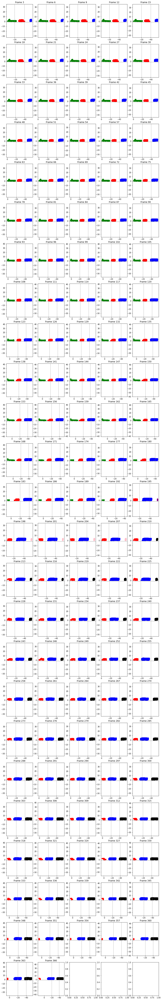

In [13]:
df_vecs = representTrackingFrames(3,endFrame=0,printMethod='2d')

Con esta nueva representación podemos ver un error entre los frames 195 y 210. Ya que se puede observar como e mismo vehículo se ha detectado como 3 vehículos diferentes durante el transcurso de estos 15 frames (primer fallo entre frames 195 y 198, segundo fallo entre frames 207 y 210). Esto se debe a que en el momento que el vehículo entra en el rango del lídar su representación no es tan precisa (debido a la distáncia, falta de puntos por entrar en el rango, etc.), esto complica la representaciñon de los clusters y a la vez la realización del tracking. 

Se podría intetar aplicar más filtros para no categorizar estos clusters como nuevo veículo o incluso optimizar los parametros del *DBSCAN*